<a href="https://colab.research.google.com/github/Adonis-Waffo/NLP_Adonis/blob/main/DIT_ComputerVsion_WAFFO_KAMDEM_Adonis_Ghislin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5
!pip install -qr yolov5/requirements.txt Roboflow
%cd yolov5

import os
from roboflow import Roboflow

import torch
from IPython.display import Image, clear_output
#from utils.google_utils import gdrive_download   https://app.roboflow.com/

clear_output()

In [2]:
rf = Roboflow(api_key="ORrngB8JsyiiLoCyvunZ")
project = rf.workspace("computer-vision-ab1jv").project("mask_dectection-czbrh")
version = project.version(3)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Mask_Dectection-3 in yolov5pytorch:: 100%|██████████| 433/433 [00:00<00:00, 7984.94it/s]


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/yolov5/Mask_Dectection-3"

In [4]:
!python train.py --img 1000 --batch 32 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt

# apikey from W&b Server 40ff8c0cf444d2d263e3966e21b6a5db1358e8db

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-12-05 10:10:36.779913: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-05 10:10:36.798646: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-05 10:10:36.804464: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to regi

In [5]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
#!kill 14123
%load_ext tensorboard
#%reload_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/exp

<IPython.core.display.Javascript object>

In [7]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/yolov5/Mask_Dectection-3/test/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Mask_Dectection-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/21 /content/yolov5/Mask_Dectection-3/test/images/b_mask125_jpeg.rf.4357a4dddcaa4bf6c7eca6c9e8ecc7ba.jpg: 416x416 1 Mask, 7.1ms
image 2/21 /content/yolov5/Mask_Dectection-3/test/images/b_mask128_jpeg.rf.f1c37115921bf51d82f99

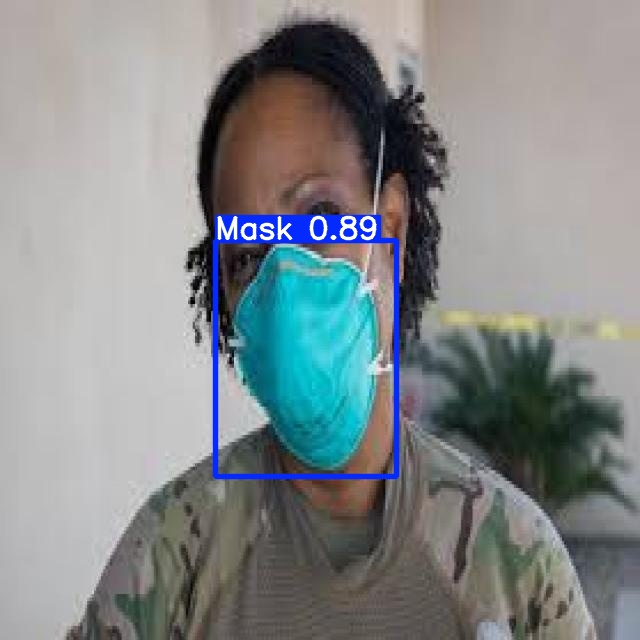

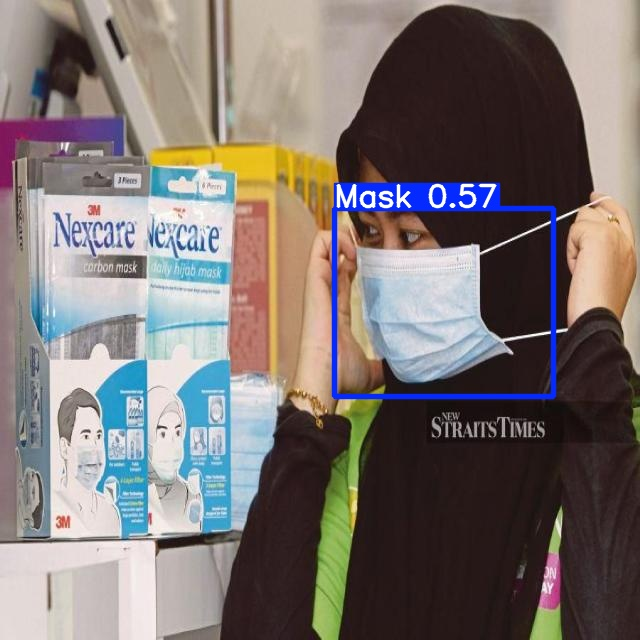

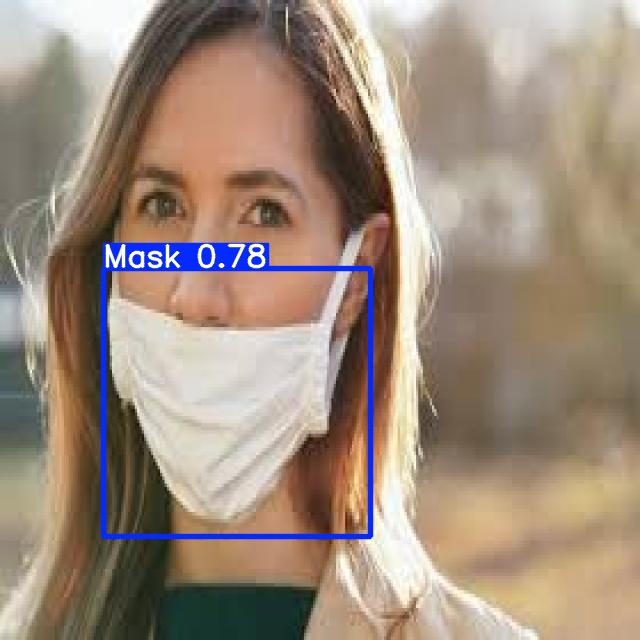

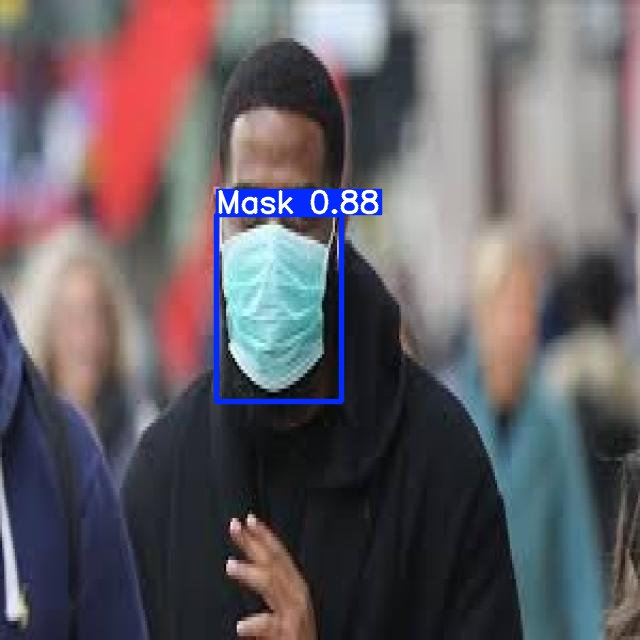

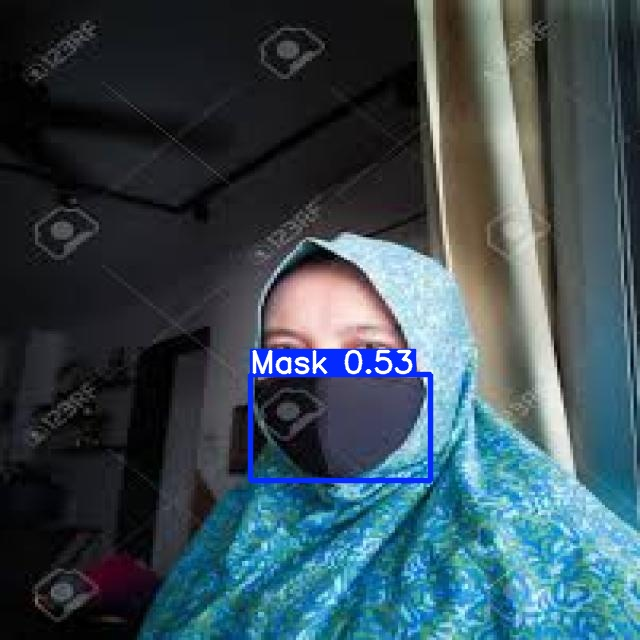

...

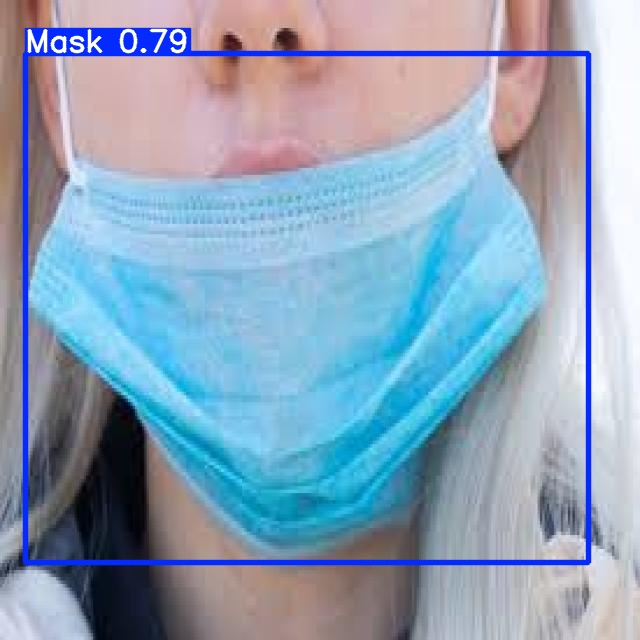

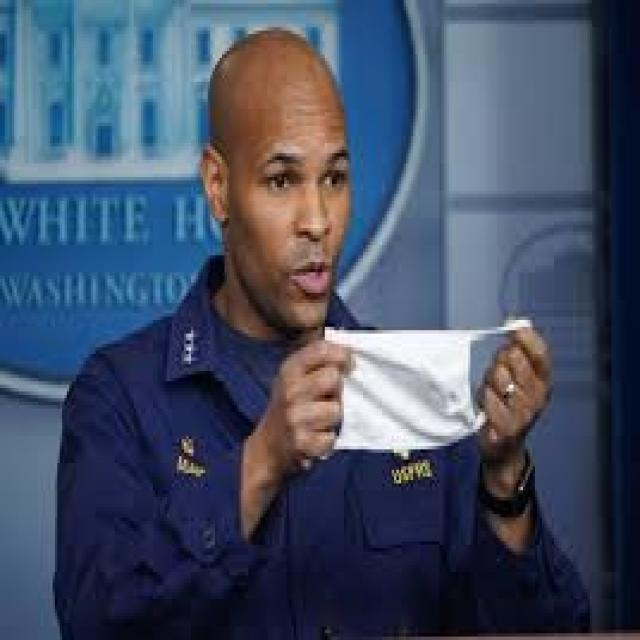

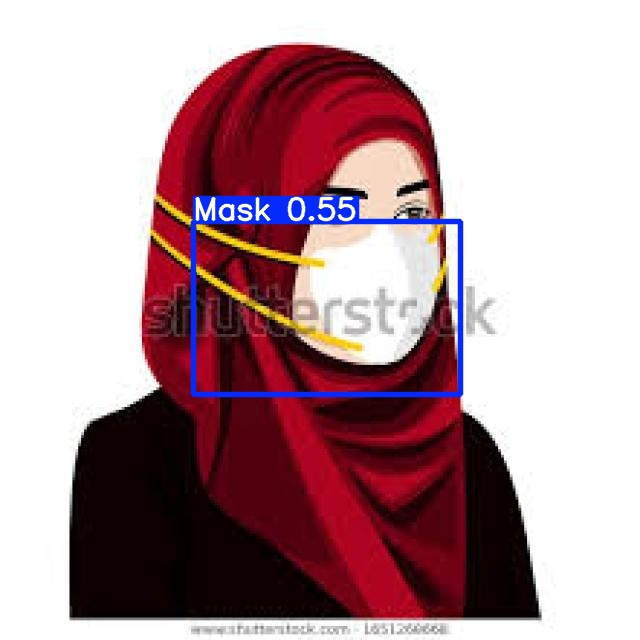

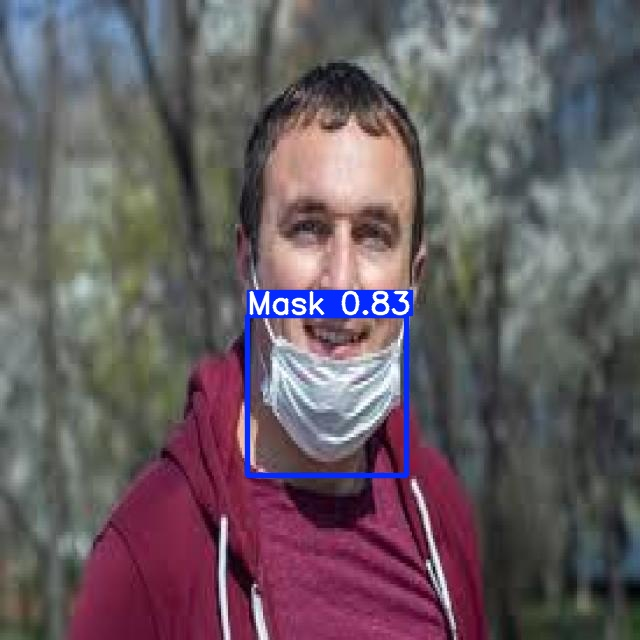

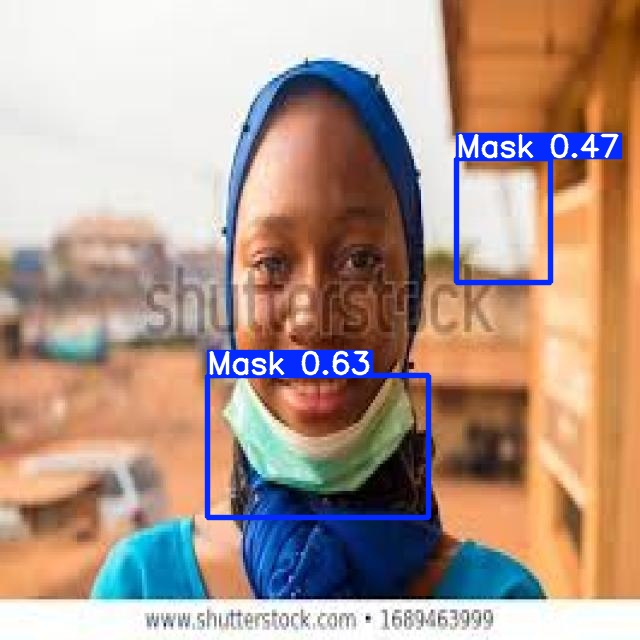

In [11]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [12]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt  --conf 0.25 --source /content/yolov5/Mask_Dectection-3/test/videos

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Mask_Dectection-3/test/videos, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/2 (1/392) /content/yolov5/Mask_Dectection-3/test/videos/Test_video1.mp4: 640x544 (no detections), 29.3ms
video 1/2 (2/392) /content/yolov5/Mask_Dectection-3/test/videos/Test_video1.mp4: 640x544 (no detections), 11.2ms
video 1/2 (3/392) /content/yolov5/Mask_Dectect

In [14]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>